In [71]:
!pip install git+https://github.com/openai/CLIP.git


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-50e1y255
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-50e1y255
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [72]:
!pip install requests tqdm pillow


In [73]:
import requests
from tqdm import tqdm
from PIL import Image
from io import BytesIO

def get_aic_images(max_images=500, per_page=100):
    url = "https://api.artic.edu/api/v1/artworks/search"
    params = {
        "fields": "id,title,artist_display,date_display,image_id,thumbnail",
        "q": "has_image:true public_domain:true",
        "limit": per_page,
        "page": 1
    }
    images = []
    while len(images) < max_images:
        resp = requests.get(url, params=params)
        data = resp.json()
        results = data.get("data", [])
        if not results:
            break
        for item in results:
            img_id = item.get("image_id")
            if not img_id:
                continue
            img_url = f"https://www.artic.edu/iiif/2/{img_id}/full/843,/0/default.jpg"
            images.append({
                "title": item.get("title"),
                "artist": item.get("artist_display"),
                "date": item.get("date_display"),
                "image_url": img_url,
                "metadata": item
            })
            if len(images) >= max_images:
                break
        params["page"] += 1
    return images

aic_works = get_aic_images(max_images=500)
print(f"Fetched {len(aic_works)} public domain artworks from AIC.")


Fetched 0 public domain artworks from AIC.


In [74]:
import requests
from tqdm import tqdm

def get_aic_images(max_images=800):
    images = []
    page = 1
    per_page = 100
    while len(images) < max_images:
        url = f"https://api.artic.edu/api/v1/artworks"
        params = {
            "fields": "id,title,artist_display,date_display,image_id,is_public_domain",
            "page": page,
            "limit": per_page,
        }
        resp = requests.get(url, params=params)
        resp.raise_for_status()
        data = resp.json()
        for item in data.get("data", []):
            if not item.get("is_public_domain"):
                continue
            img_id = item.get("image_id")
            if not img_id:
                continue
            img_url = f"https://www.artic.edu/iiif/2/{img_id}/full/843,/0/default.jpg"
            images.append({
                "title": item.get("title"),
                "artist": item.get("artist_display"),
                "date": item.get("date_display"),
                "image_url": img_url,
                "metadata": item
            })
            if len(images) >= max_images:
                break
        if not data.get("pagination", {}).get("next_url"):
            break
        page += 1
    return images

aic_works = get_aic_images(max_images=1200)
print(f"Fetched {len(aic_works)} public domain artworks from AIC.")


Fetched 1200 public domain artworks from AIC.


In [75]:
import clip
import torch
from PIL import Image
from io import BytesIO
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

def download_image(url):
    try:
        r = requests.get(url)
        if r.status_code == 200:
            return Image.open(BytesIO(r.content)).convert("RGB")
    except:
        return None
    return None

#Turns a PIL image into a 512-dimensional CLIP “feature vector” (embedding), normalized for similarity search.
def embed_image(pil_img):
    with torch.no_grad():
        img_input = preprocess(pil_img).unsqueeze(0).to(device)
        feat = model.encode_image(img_input)
        feat = feat / feat.norm(dim=-1, keepdim=True)
        return feat.cpu().numpy()[0]

# Extract features for all images
all_features = []
titles = []
artists = []
years = []
images = []

from tqdm import tqdm

for w in tqdm(aic_works):
    img = download_image(w["image_url"])
    if img is not None:
        all_features.append(embed_image(img))
        titles.append(w["title"])
        artists.append(w["artist"])
        years.append(w["date"])
        images.append(img)

all_features = np.stack(all_features)
print(f"Embedded {len(all_features)} AIC artworks.")


100%|██████████| 1200/1200 [06:57<00:00,  2.87it/s]

Embedded 1197 AIC artworks.


In [76]:
from sklearn.metrics.pairwise import cosine_similarity

def find_similar(query_idx, top_k=5):
    """
    Finds the top_k visually similar artworks to the artwork at query_idx.

    Args:
        query_idx (int): Index of the query artwork in your dataset.
        top_k (int): Number of similar results to return.

    Returns:
        list of (title, artist, date, similarity_score, result_idx)
    """
    emb = all_features[query_idx]
    emb = emb / np.linalg.norm(emb)
    sims = cosine_similarity(emb.reshape(1, -1), all_features)[0]
    topk_idx = sims.argsort()[::-1][1:top_k+1]  # skip self
    return [(titles[i], artists[i], years[i], sims[i], i) for i in topk_idx]

# Example: show most similar to the first image
query_title = titles[0]
print(f"Query: {query_title}")
results = find_similar(0, top_k=5)
for t, a, d, s, idx in results:
    print(f"- {t} ({a}, {d}) [score: {s:.2f}]")


Query: A Goddess
- Statuette of a Striding Figure (Mesopotamian or Iranian, 3000-2800 BCE) [score: 0.90]
- Jizo Bosatsu (Japanese, Kamakura period, late 12th/early 13th century) [score: 0.88]
- Veranda Post (Òpó Ògògá) (Olowe of Ise (died 1938)
Yòrùbá: Èkìtì; Ikere, Nigeria
Coastal West Africa, 1910-14) [score: 0.86]
- Kuttrolf (Bottle with Divided Neck) (Late Roman or Byzantine; possibly Eastern Mediterranean, 4th century) [score: 0.86]
- Jaina Tirthankara Chandraprabha Standing in Meditation (Kayotsarga) (India
Karnataka, 12th century) [score: 0.86]


Query: A Goddess (Vietnam, Champa period,  9th–10th century)


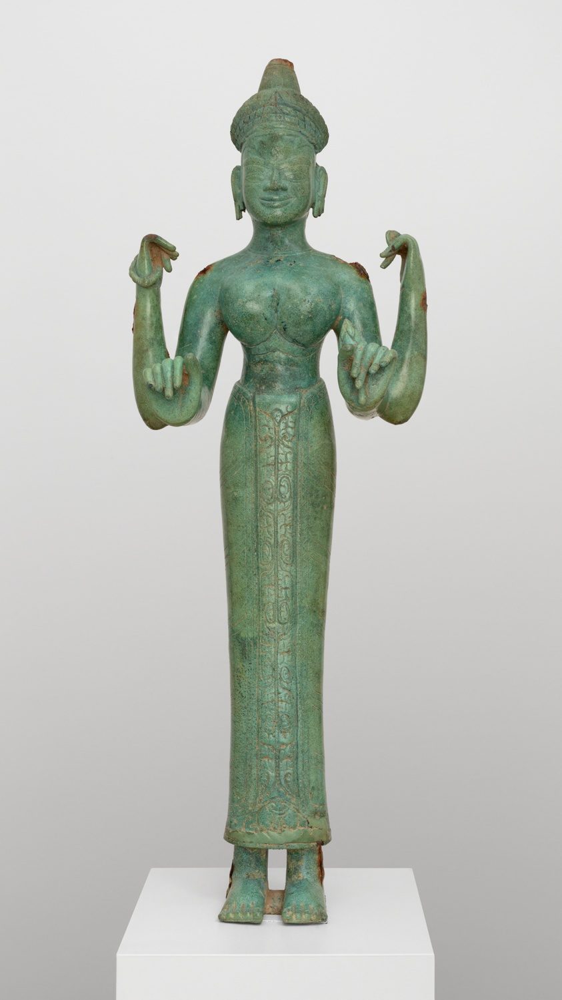

- Statuette of a Striding Figure (Mesopotamian or Iranian, 3000-2800 BCE) [score: 0.90]


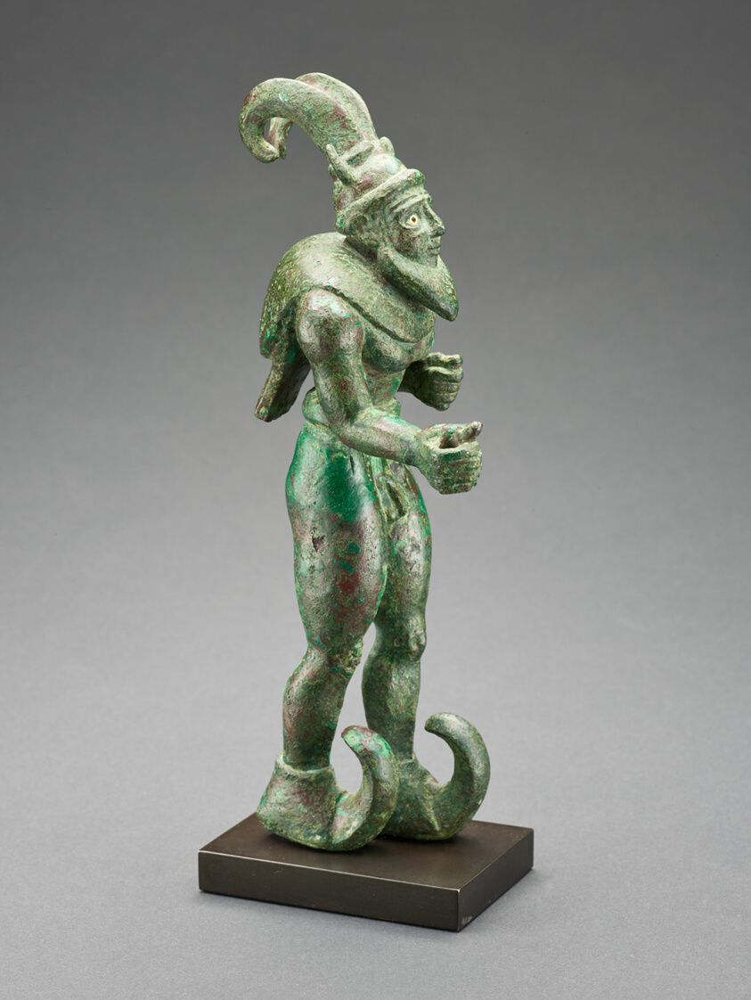

- Jizo Bosatsu (Japanese, Kamakura period, late 12th/early 13th century) [score: 0.88]


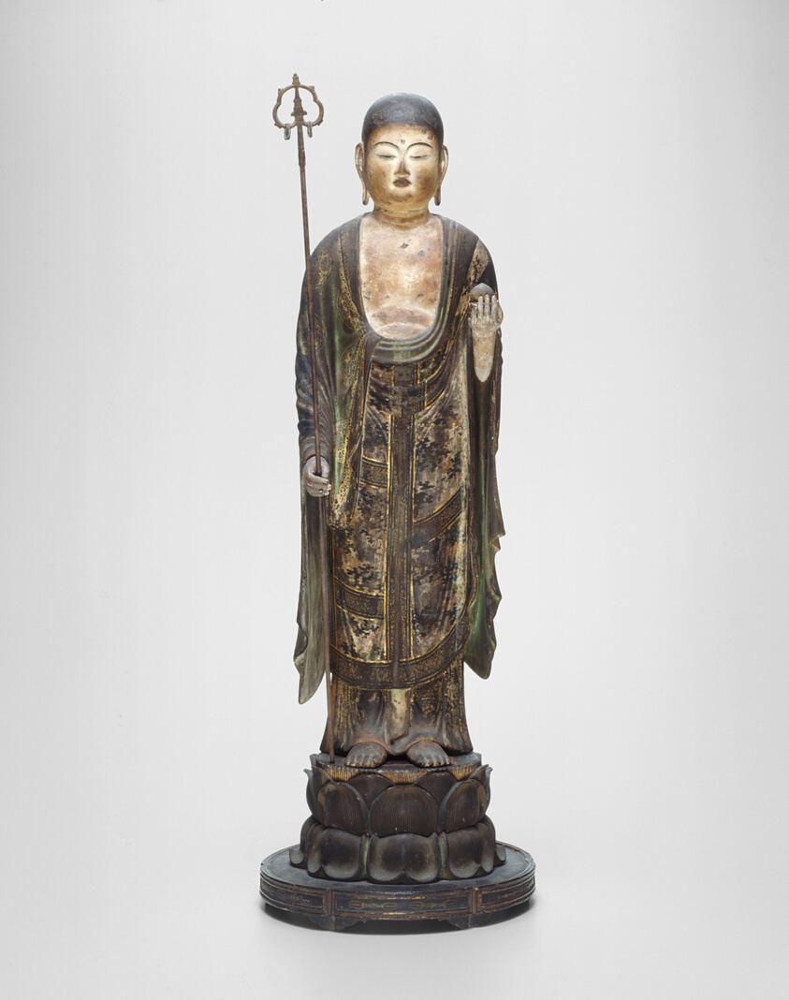

- Veranda Post (Òpó Ògògá) (Olowe of Ise (died 1938)
Yòrùbá: Èkìtì; Ikere, Nigeria
Coastal West Africa, 1910-14) [score: 0.86]


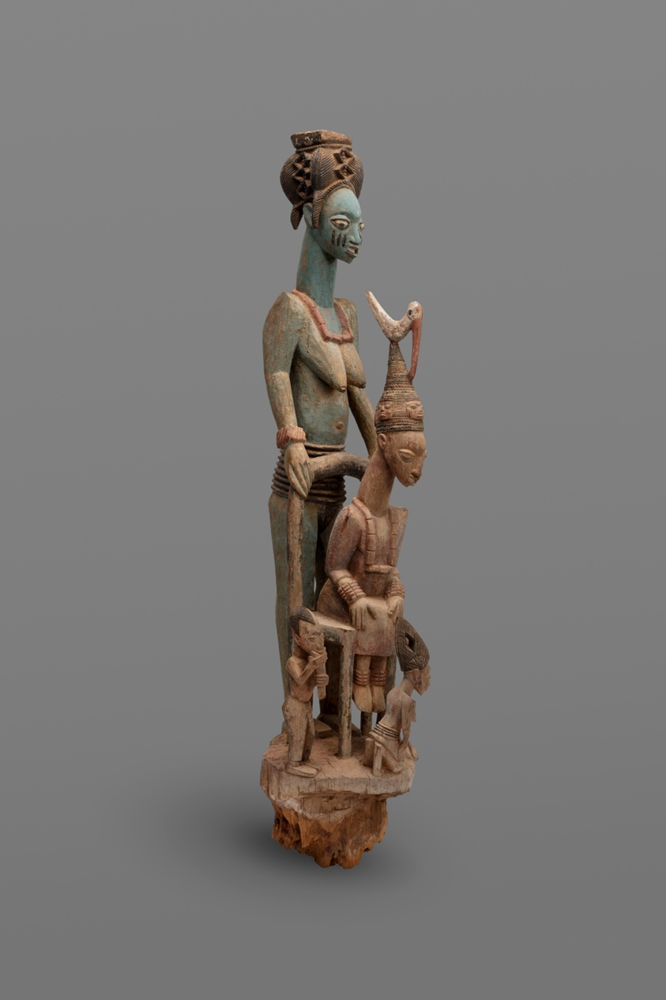

- Kuttrolf (Bottle with Divided Neck) (Late Roman or Byzantine; possibly Eastern Mediterranean, 4th century) [score: 0.86]


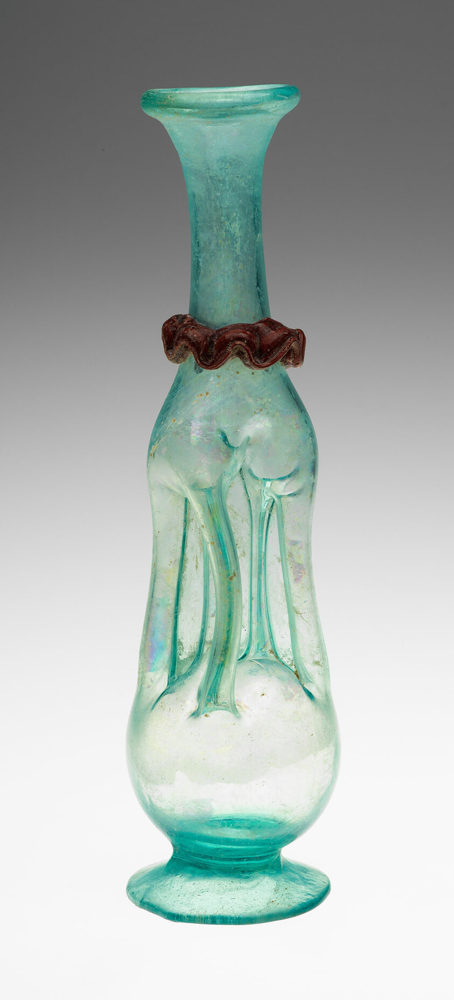

- Jaina Tirthankara Chandraprabha Standing in Meditation (Kayotsarga) (India
Karnataka, 12th century) [score: 0.86]


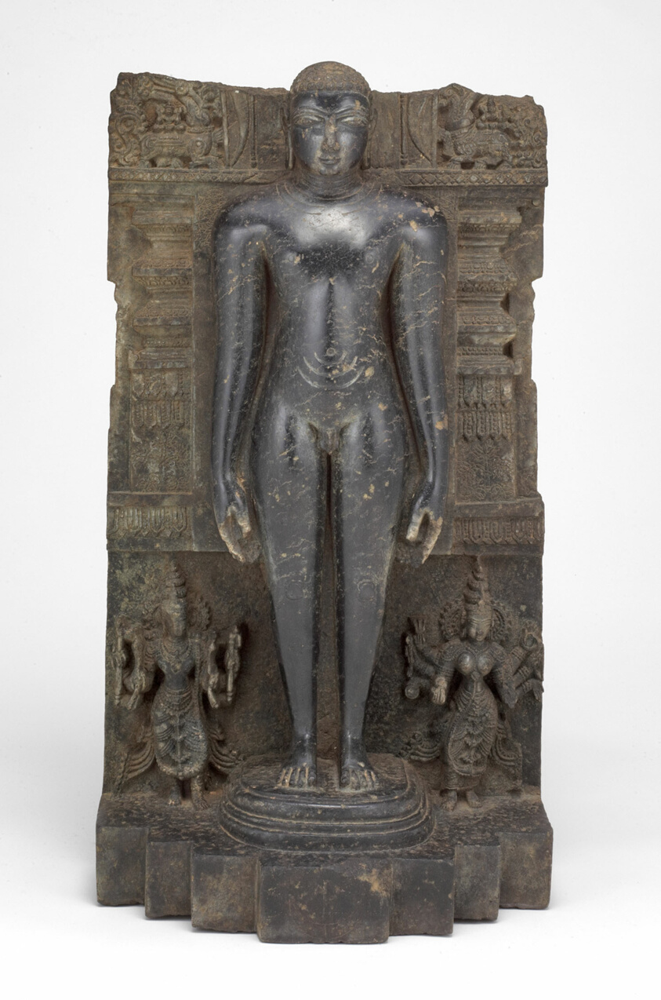

In [77]:
from IPython.display import display

def show_similar(query_idx, top_k=5):
    """
    Displays the query image and its top_k visually similar artworks.
    """
    print(f"Query: {titles[query_idx]} ({artists[query_idx]}, {years[query_idx]})")
    display(images[query_idx])
    results = find_similar(query_idx, top_k=top_k)
    for t, a, d, s, idx in results:
        print(f"- {t} ({a}, {d}) [score: {s:.2f}]")
        display(images[idx])

# Example usage:
show_similar(0)


In [78]:
# Filter to only paintings
paintings = [
    w for w in aic_works
    if 'Painting' in (w['metadata'].get('classification_titles') or [])
]
print(f"Found {len(paintings)} paintings out of {len(aic_works)} total works.")


Found 0 paintings out of 1200 total works.


In [79]:
for w in aic_works[:20]:  # Try first 20
    print(w["title"], w["metadata"].get("classification_titles"))


A Goddess None
Black-and-White Storage Jar with Abstract Geometric Motifs None
The Martyrdom of Saint Simon of Trent from Schedel Weltchronik (Schedel’s World History), Plate 23 from Woodcuts from Books of the 15th Century None
The Elements (Furnishing Fabric) None
Tarragona Terrace and Garden None
Doctor Syntax Returned from His Tour, from The Tour of Doctor Syntax None
Map of North America (Handkerchief) None
A Sunday on La Grande Jatte — 1884 None
Buddha Shakyamuni Seated in Meditation (Dhyanamudra) None
Funerary Urn (Hunping) None
Flowers in an Urn Decorated with Putti, on a Plinth None
Doctor Syntax Meditating on the Tomb Stones, from The Tour of Doctor Syntax None
Cinerary Urn of Plautia Hesperis None
The Eruption of Vesuvius None
Flight from Pompeii None
Naples with Mt. Vesuvius None
Mrs. George Swinton (Elizabeth Ebsworth) None
Portrait of Philippe Coypel and His Wife None
Rack Picture for Dr. Nones None
Gaming Set None


In [80]:
for w in aic_works[:30]:
    print("TITLE:", w['title'])
    print("ARTIST:", w['artist'])
    print("DATE:", w['date'])
    print("MEDIUM:", w['metadata'].get('medium_display'))
    print("CLASSIFICATION:", w['metadata'].get('classification_titles'))
    print("ALL METADATA:", w['metadata'])
    print('-' * 60)


TITLE: A Goddess
ARTIST: Vietnam
DATE: Champa period,  9th–10th century
MEDIUM: None
CLASSIFICATION: None
ALL METADATA: {'id': 152836, 'title': 'A Goddess', 'date_display': 'Champa period,  9th–10th century', 'artist_display': 'Vietnam', 'is_public_domain': True, 'image_id': 'bc4012ab-b53a-4832-3bff-c23a838ffd43'}
------------------------------------------------------------
TITLE: Black-and-White Storage Jar with Abstract Geometric Motifs
ARTIST: Acoma
Acoma Pueblo, New Mexico, United States
DATE: 1890s
MEDIUM: None
CLASSIFICATION: None
ALL METADATA: {'id': 189294, 'title': 'Black-and-White Storage Jar with Abstract Geometric Motifs', 'date_display': '1890s', 'artist_display': 'Acoma\nAcoma Pueblo, New Mexico, United States', 'is_public_domain': True, 'image_id': '33102f83-7408-ae99-63f3-09a331d186e0'}
------------------------------------------------------------
TITLE: The Martyrdom of Saint Simon of Trent from Schedel Weltchronik (Schedel’s World History), Plate 23 from Woodcuts from 

In [81]:
def get_aic_images_full(max_images=100):
    images = []
    page = 1
    per_page = 100
    while len(images) < max_images:
        url = f"https://api.artic.edu/api/v1/artworks"
        params = {
            "fields": "id,image_id,is_public_domain",
            "page": page,
            "limit": per_page,
        }
        resp = requests.get(url, params=params)
        resp.raise_for_status()
        data = resp.json()
        for item in data.get("data", []):
            if not item.get("is_public_domain"):
                continue
            img_id = item.get("image_id")
            if not img_id:
                continue
            # Fetch the full details for this object
            detail_url = f"https://api.artic.edu/api/v1/artworks/{item['id']}"
            detail_resp = requests.get(detail_url)
            detail_resp.raise_for_status()
            detail_data = detail_resp.json()["data"]
            img_url = f"https://www.artic.edu/iiif/2/{img_id}/full/843,/0/default.jpg"
            images.append({
                "title": detail_data.get("title"),
                "artist": detail_data.get("artist_display"),
                "date": detail_data.get("date_display"),
                "medium": detail_data.get("medium_display"),
                "image_url": img_url,
                "metadata": detail_data
            })
            if len(images) >= max_images:
                break
        if not data.get("pagination", {}).get("next_url"):
            break
        page += 1
    return images

# Fetch 100 artworks with full metadata (increase max_images if needed)
aic_works = get_aic_images_full(max_images=1000)
print(f"Fetched {len(aic_works)} public domain artworks from AIC.")


Fetched 1000 public domain artworks from AIC.


In [82]:
def is_painting(meta):
    medium = (meta.get("medium_display") or "").lower()
    keywords = ["paint", "oil", "tempera", "acrylic"]
    return any(k in medium for k in keywords)

paintings = [w for w in aic_works if is_painting(w["metadata"])]
print(f"Found {len(paintings)} paintings out of {len(aic_works)} total works.")


Found 163 paintings out of 1000 total works.


In [83]:
def is_painting(meta):
    medium = (meta.get("medium_display") or "").lower()
    keywords = ["paint", "oil", "tempera", "acrylic"]
    return any(k in medium for k in keywords)

paintings = [w for w in aic_works if is_painting(w["metadata"])]
print(f"Found {len(paintings)} paintings out of {len(aic_works)} total works.")


Found 163 paintings out of 1000 total works.


In [84]:
import torch
import clip
from PIL import Image
from io import BytesIO
import numpy as np
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

def download_image(url):
    try:
        r = requests.get(url)
        if r.status_code == 200:
            return Image.open(BytesIO(r.content)).convert("RGB")
    except:
        return None
    return None

def embed_image(pil_img):
    with torch.no_grad():
        img_input = preprocess(pil_img).unsqueeze(0).to(device)
        feat = model.encode_image(img_input)
        feat = feat / feat.norm(dim=-1, keepdim=True)
        return feat.cpu().numpy()[0]

all_features = []
titles = []
artists = []
years = []
image_urls = []

for w in tqdm(paintings):
    img = download_image(w["image_url"])
    if img is not None:
        all_features.append(embed_image(img))
        titles.append(w["title"])
        artists.append(w["artist"])
        years.append(w["date"])
        image_urls.append(w["image_url"])

all_features = np.stack(all_features)


100%|██████████| 163/163 [00:56<00:00,  2.89it/s]


Query: A Sunday on La Grande Jatte — 1884
- Te raau rahi (The Big Tree) by Paul Gauguin (French, 1848–1903) (1891) [score: 0.80]


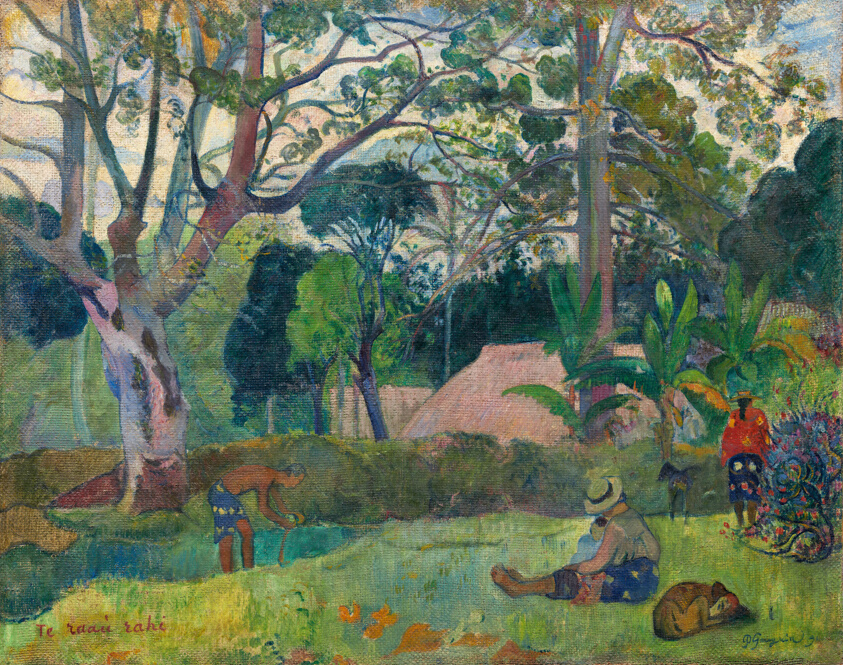

- Arlésiennes (Mistral) by Paul Gauguin (French, 1848–1903) (1888) [score: 0.80]


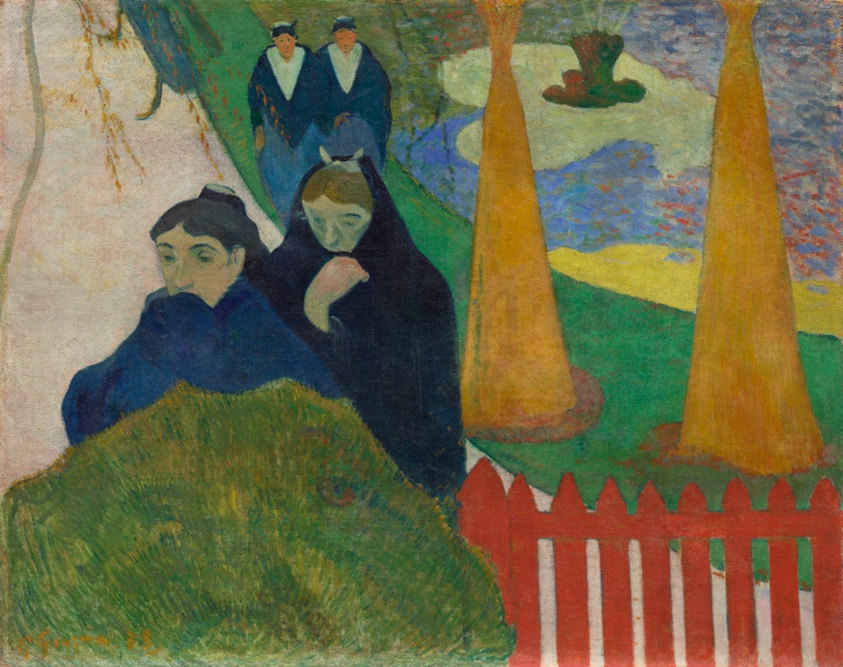

- Mahana no atua (Day of the God) by Paul Gauguin (French, 1848–1903) (1894) [score: 0.78]


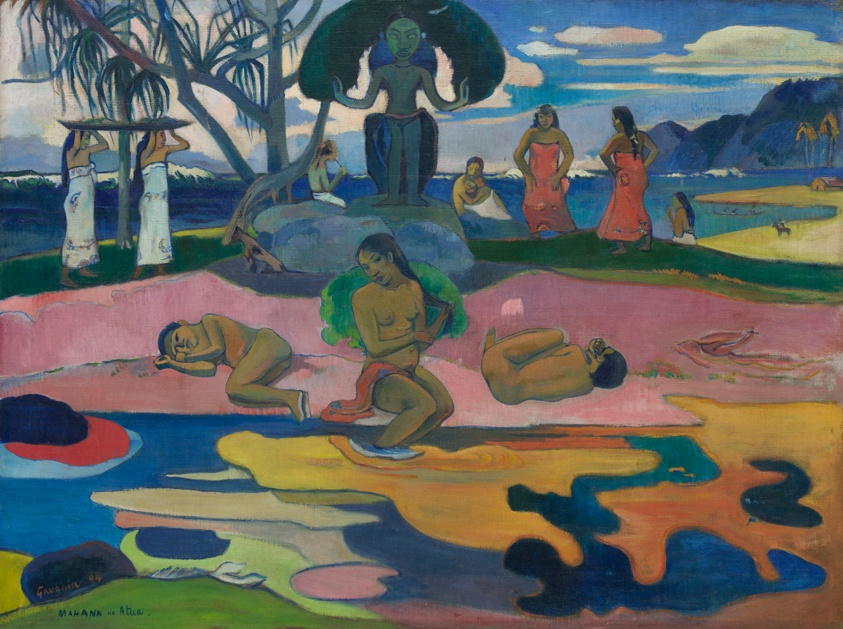

- Near the Lake by Pierre-Auguste Renoir (French, 1841–1919) (1879–80) [score: 0.78]


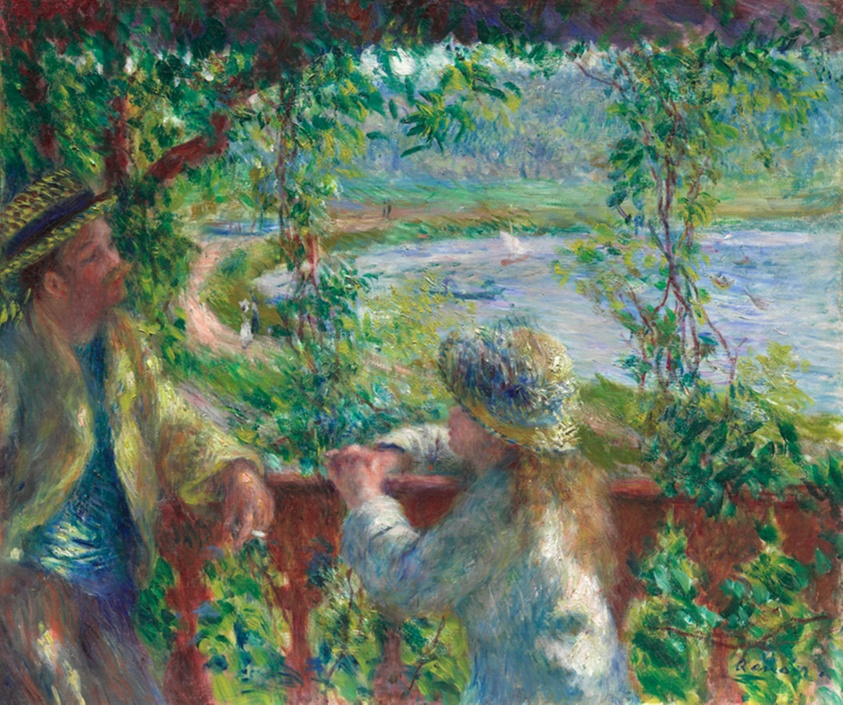

- No te aha oe riri (Why Are You Angry?) by Paul Gauguin (French, 1848–1903) (1896) [score: 0.78]


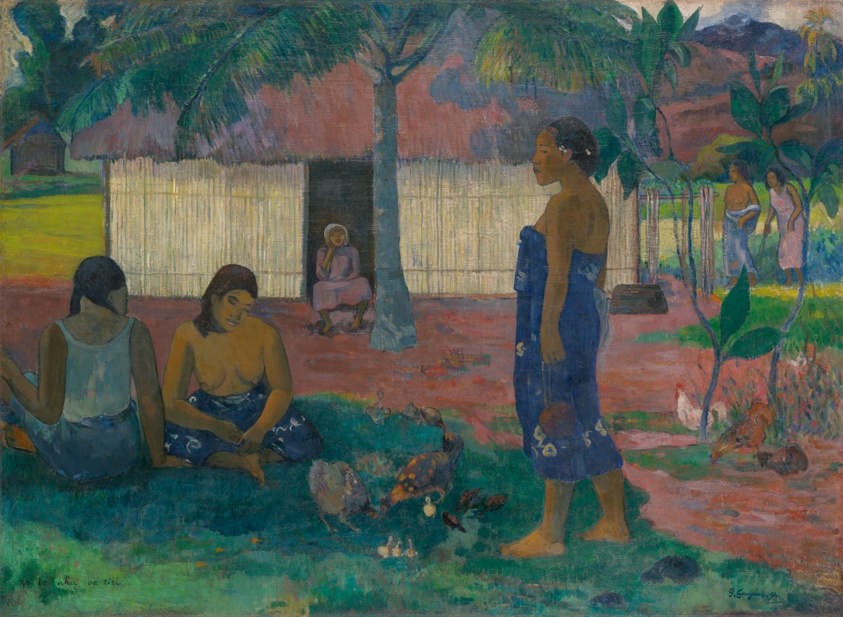

In [85]:
# Example robust find_similar function:
def find_similar(idx, top_k=5):
    sims = cosine_similarity(all_features[idx].reshape(1, -1), all_features)[0]
    top_idx = np.argsort(sims)[::-1][1:top_k+1]  # skip the query itself
    # Always return indices, not titles!
    return top_idx, [sims[i] for i in top_idx]

# Display matches robustly
query_idx = 0
query_painting = paintings[query_idx]
print("Query:", query_painting.get('title') or "Untitled")

match_indices, match_scores = find_similar(query_idx)
for i, score in zip(match_indices, match_scores):
    match = paintings[i]
    title = match.get('title') or "Untitled"
    artist = match.get('artist') or "Unknown Artist"
    year = match.get('date') or "Unknown Year"
    print(f"- {title} by {artist} ({year}) [score: {score:.2f}]")
    display(IPImage(requests.get(match['image_url']).content))


In [86]:
import requests, time, random, pathlib, json
from tqdm import tqdm

def get_met_paintings(max_paintings=1000, cache_dir="met_cache", per_query_limit=1500):
    base_url = "https://collectionapi.metmuseum.org/public/collection/v1"
    # Setup cache dir
    cache = pathlib.Path(cache_dir)
    cache.mkdir(exist_ok=True)

    # Search for paintings with images and public domain
    print("Querying Met for painting object IDs...")
    resp = requests.get(f"{base_url}/search", params={
        "q": "painting", "hasImages": "true", "isPublicDomain": "true"
    })
    resp.raise_for_status()
    object_ids = resp.json().get("objectIDs", [])[:per_query_limit]
    print(f"Found {len(object_ids)} candidate paintings (fetching up to {max_paintings})")

    paintings = []
    for oid in tqdm(object_ids):
        cache_file = cache / f"{oid}.json"
        # Check cache first
        if cache_file.exists():
            try:
                obj = json.loads(cache_file.read_text())
            except Exception:
                obj = None
        else:
            for attempt in range(3):
                try:
                    resp = requests.get(f"{base_url}/objects/{oid}", timeout=10)
                    if resp.status_code != 200:
                        obj = None
                        break
                    obj = resp.json()
                    # Save to cache
                    cache_file.write_text(json.dumps(obj))
                    break
                except Exception as e:
                    print(f"Attempt {attempt+1}: {oid} error: {e}")
                    time.sleep(0.5 * (2**attempt))
                    obj = None
            if obj is None:
                continue
        # Now filter for paintings
        try:
            if obj.get("isPublicDomain") and obj.get("primaryImageSmall"):
                medium = (obj.get("medium") or "").lower()
                if any(k in medium for k in ["paint", "oil", "tempera", "acrylic"]):
                    paintings.append({
                        "title": obj.get("title") or "Untitled",
                        "artist": obj.get("artistDisplayName") or "Unknown",
                        "date": obj.get("objectDate") or "Unknown",
                        "medium": obj.get("medium") or "",
                        "image_url": obj.get("primaryImageSmall"),
                        "metadata": obj,
                        "source": "met"
                    })
        except Exception as e:
            print(f"Error processing {oid}: {e}")
            continue
        if len(paintings) >= max_paintings:
            break
        time.sleep(0.05 + random.random() * 0.05)  # Polite delay
    print(f"Fetched {len(paintings)} paintings from The Met.")
    return paintings

# Example usage:
paintings_met = get_met_paintings(max_paintings=1000)


Querying Met for painting object IDs...
Found 135 candidate paintings (fetching up to 1000)


100%|██████████| 135/135 [00:15<00:00,  8.99it/s]

Fetched 43 paintings from The Met.


In [98]:
paintings_met = get_met_paintings(max_paintings=1000)


Querying Met for painting object IDs...
Found 135 candidate paintings (fetching up to 1000)


100%|██████████| 135/135 [00:28<00:00,  4.69it/s]


Fetched 60 paintings from The Met.


In [99]:
paintings_aic = [w for w in aic_works if is_painting(w["metadata"])]


In [100]:
def get_cma_paintings(max_images=1000):
    url = "https://openaccess-api.clevelandart.org/api/artworks/"
    paintings = []
    page = 1
    per_page = 1200
    while len(paintings) < max_images:
        params = {
            "type": "Painting",
            "has_image": 1,
            "public_domain": 1,
            "limit": per_page,
            "skip": (page-1) * per_page,
        }
        resp = requests.get(url, params=params)
        data = resp.json()
        for item in data["data"]:
            img_url = item.get("images", {}).get("web", "")
            if img_url:
                creators = item.get("creators", [])
                artist = creators[0]["description"] if creators else "Unknown"
                paintings.append({
                    "title": item.get("title"),
                    "artist": artist,
                    "date": item.get("creation_date", ""),
                    "medium": item.get("technique", ""),
                    "image_url": img_url,
                    "metadata": item,
                    "source": "cma"
                })
            if len(paintings) >= max_images:
                break
        if not data.get("info", {}).get("next"):
            break
        page += 1
    print(f"Fetched {len(paintings)} paintings from Cleveland Museum of Art.")
    return paintings

paintings_cma = get_cma_paintings(max_images=1000)


Fetched 1000 paintings from Cleveland Museum of Art.


In [102]:
all_paintings = paintings_aic + paintings_met + paintings_cma
print(f"Total paintings in dataset: {len(all_paintings)}")

Total paintings in dataset: 1223


In [106]:
all_features = []
titles = []
artists = []
years = []
images = []
sources = []
success_paintings = []

from tqdm import tqdm

for w in tqdm(all_paintings):
    img = download_image(w["image_url"])
    if img is not None:
        all_features.append(embed_image(img))
        titles.append(w["title"])
        artists.append(w["artist"])
        years.append(w["date"])
        images.append(img)
        sources.append(w.get("source", "unknown"))
        success_paintings.append(w)

all_features = np.stack(all_features)


100%|██████████| 1223/1223 [01:20<00:00, 15.17it/s]


In [109]:
for name in ["all_features","titles","artists","years","images","sources","success_paintings"]:
    globals().pop(name, None)

import numpy as np
from tqdm import tqdm

# 2) Re-initialize as pure Python lists
all_features      = []
titles            = []
artists           = []
years             = []
images            = []
sources           = []
success_paintings = []

# 3) Loop over your cleaned list of paintings
for w in tqdm(all_paintings, desc="Embedding paintings"):
    img = download_image(w["image_url"])
    if img is not None:
        feat = embed_image(img)
        all_features.append(feat)
        titles.append(w["title"])
        artists.append(w["artist"])
        years.append(w["date"])
        images.append(img)
        sources.append(w.get("source", "unknown"))
        success_paintings.append(w)

# 4) Stack into a single NumPy array once—*after* the loop finishes
all_features = np.stack(all_features)
print(f"Embedded {len(all_features)} paintings.")


Embedding paintings: 100%|██████████| 1223/1223 [01:37<00:00, 12.54it/s]  

Embedded 223 paintings.


Query: Don Andrés de Andrade y la Cal by Bartolomé Estebán Murillo (ca. 1665–72) [met]


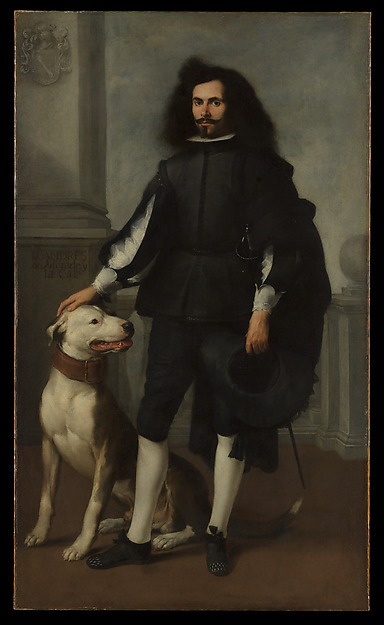

- Arrangement in Flesh Color and Brown: Portrait of Arthur Jerome Eddy by James McNeill Whistler (American, 1834–1903) (1894) [unknown] — score 0.80


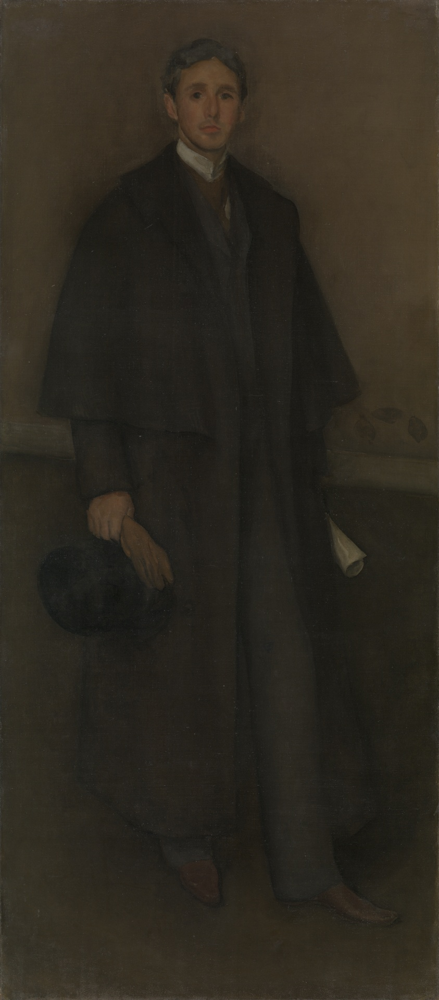

- Don Gaspar de Guzmán (1587–1645), Count-Duke of Olivares by Juan Bautista Martínez del Mazo (ca. 1636 or later) [met] — score 0.80


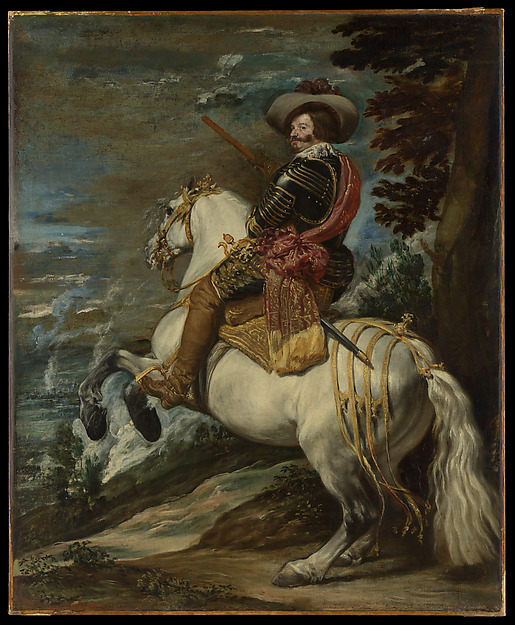

- Beggar with a Duffle Coat (Philosopher) by Édouard Manet (French, 1832-1883) (1865–67) [unknown] — score 0.77


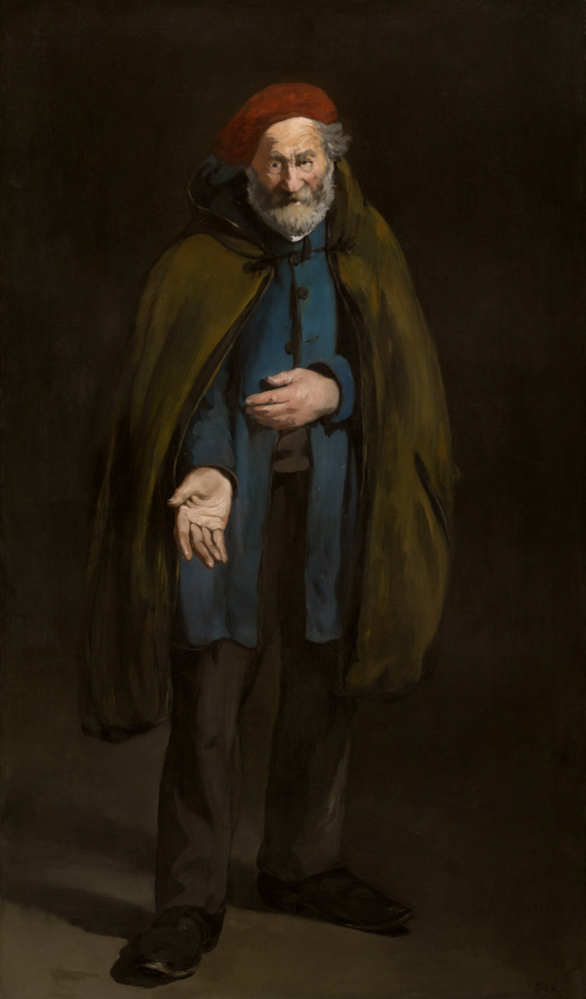

- A Woman with a Dog by Giacomo Ceruti (1740s) [met] — score 0.75


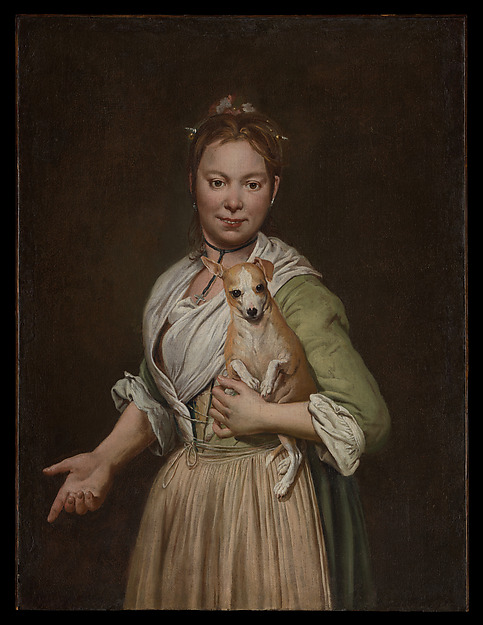

- The Smokers by Adriaen Brouwer (ca. 1636) [met] — score 0.75


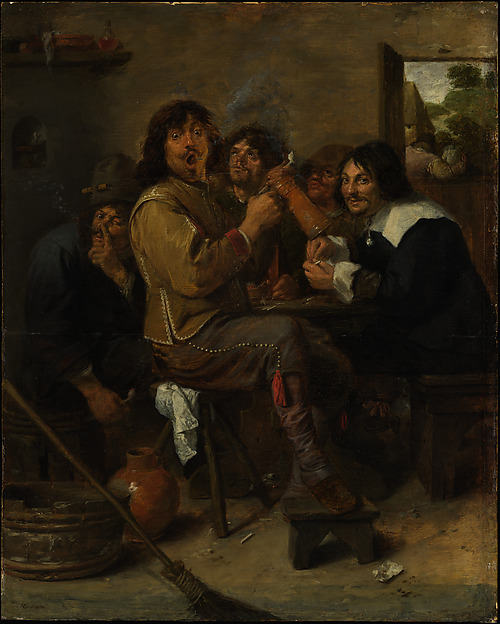

In [110]:
import random
from IPython.display import display, Image as IPImage


idx = random.randrange(len(success_paintings))
print(f"Query: {titles[idx]} by {artists[idx]} ({years[idx]}) [{sources[idx]}]")
display(IPImage(requests.get(success_paintings[idx]['image_url']).content))

for t, a, y, src, score, i in find_similar(idx, top_k=5):
    print(f"- {t} by {a} ({y}) [{src}] — score {score:.2f}")
    display(IPImage(requests.get(success_paintings[i]['image_url']).content))


In [111]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def find_similar(idx, top_k=5):
    vec = all_features[idx].reshape(1, -1)
    sims = cosine_similarity(vec, all_features)[0]  # shape (N,)
    order = np.argsort(sims)[::-1]  # descending
    results = []
    for i in order:
        if i == idx:
            continue  # skip self
        results.append({
            "title": titles[i],
            "artist": artists[i],
            "date": years[i],
            "source": sources[i],
            "score": sims[i],
            "index": i
        })
        if len(results) >= top_k:
            break
    return results


Query: Breton Bather by Paul Gauguin
French, 1848-1903 (1886/87) [source: unknown]


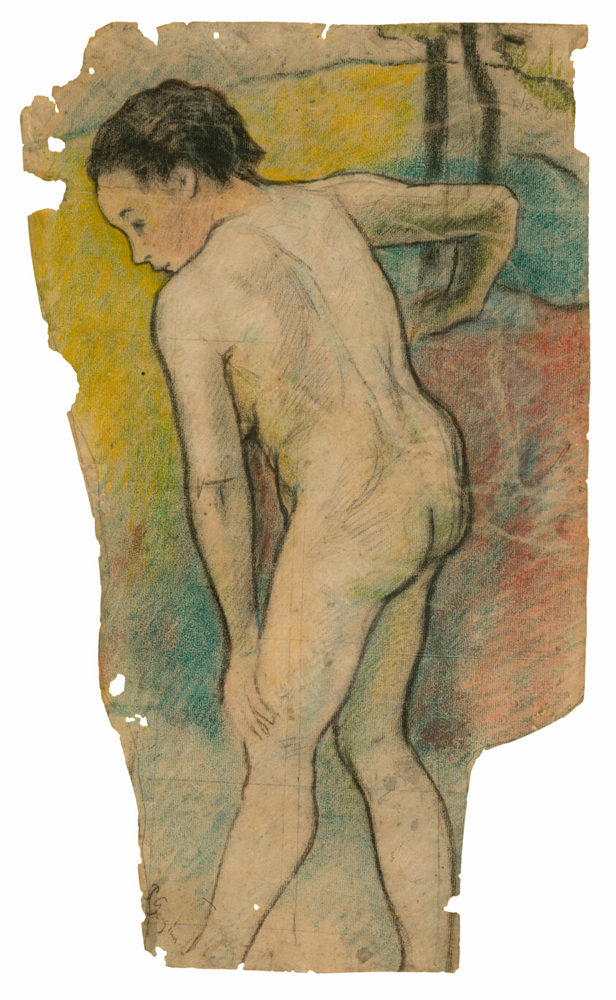

- Te faruru (Here We Make Love), from the Noa Noa Suite by Paul Gauguin
French, 1848-1903 (1893/94) [source: unknown] — score 0.80


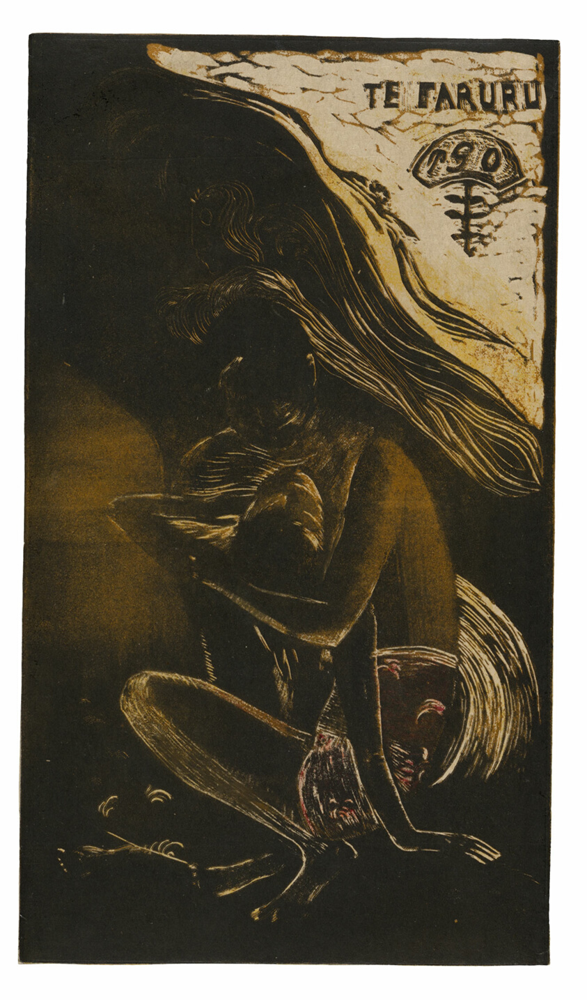

- Manao tupapau (She Thinks of the Ghost or The Ghost Thinks of Her), from the Noa Noa Suite by Paul Gauguin
French, 1848-1903 (1893/94) [source: unknown] — score 0.78


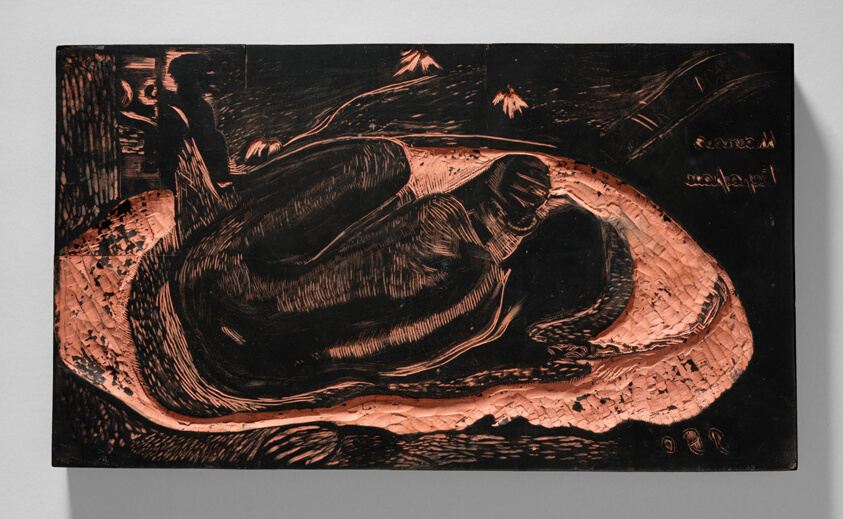

- Seated Bather by Pierre-Auguste Renoir (French, 1841–1919) (1914) [source: unknown] — score 0.78


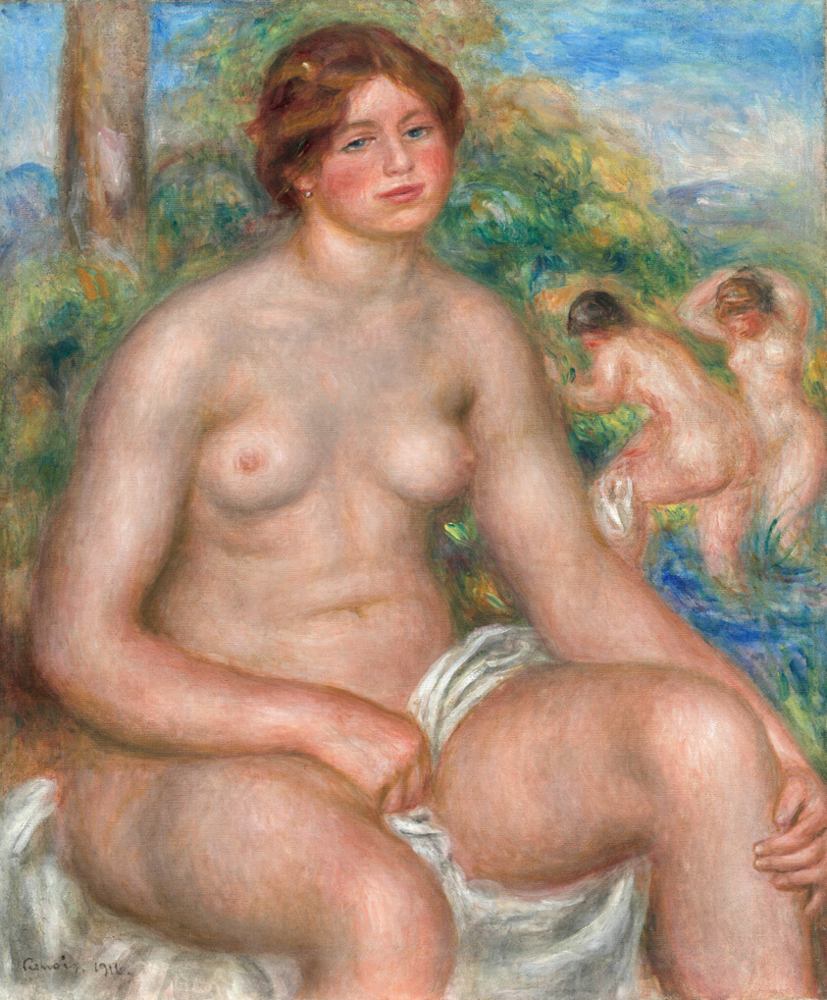

- Maruru (Offerings of Gratitude), from the Noa Noa Suite by Paul Gauguin
French, 1848-1903 (1893/94) [source: unknown] — score 0.76


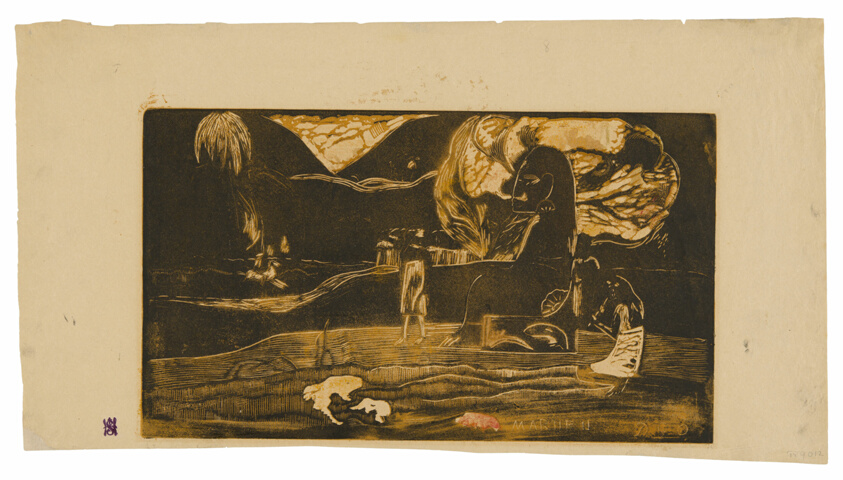

- Soyez amoureuses, vous serez heureuses (Love, and You Will Be Happy), from the Suite of Late Wood-Block Prints by Paul Gauguin
French, 1848-1903 (1899) [source: unknown] — score 0.76


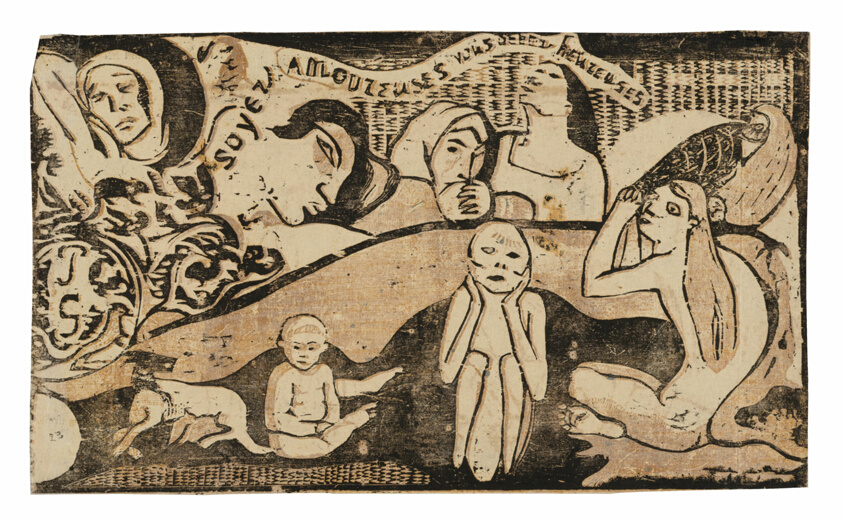

In [117]:
import random
from IPython.display import display, Image as IPImage
import requests

idx = random.randrange(len(success_paintings))
print(f"Query: {titles[idx]} by {artists[idx]} ({years[idx]}) [source: {sources[idx]}]")
display(IPImage(requests.get(success_paintings[idx]['image_url']).content))

for match in find_similar(idx, top_k=5):
    title = match["title"] or "Untitled"
    artist = match["artist"] or "Unknown"
    date = match["date"] or "Unknown"
    source = match["source"] or "unknown"
    score = match["score"]
    print(f"- {title} by {artist} ({date}) [source: {source}] — score {score:.2f}")
    display(IPImage(requests.get(success_paintings[match["index"]]['image_url']).content))
